# 🔥 CSE 475 – Assignment 2 (Merged Notebook)
## 🧠 Self‑Supervised Model 1 — **DINOv3 Pretext + Downstream YOLOv12n** (All‑in‑One)

**Course:** CSE 475 – Machine Learning  
**Section:** 03  

### 👥 Group 02
- Osama Bin Qashem (2022-2-60-058)  
- Saif Khan (2022-2-60-063)  
- Mahmudul Hasan Hamim (2022-2-60-079)  
- Nusrat Jahan Oishi (2022-2-60-033)  

**Dataset:** Roboflow Weeds Dataset (YOLO format) 🌿  
**Detector Backbone (Assignment 1):** YOLOv12n ✅  

---

## 🎯 What this single notebook covers
This merged notebook runs the complete pipeline end‑to‑end:

### ✅ Part A — DINOv3 Pretext (Self‑Supervised Distillation)
- Build a consistent SSL split: **80/10/10** overall + **20% labeled / 80% unlabeled** inside train
- Use **only unlabeled images** for SSL (labels ignored)
- Run **LightlyTrain distillation**:
  - **Teacher:** DINOv3 ViT‑B/16
  - **Student:** Ultralytics YOLOv12n
- Export checkpoint:
  - `/kaggle/working/dino_pretext_yolov12.pt`

### ✅ Part B — Downstream (Supervised Fine‑Tuning for Detection)
- Load the DINOv3‑pretrained YOLOv12n checkpoint
- Fine‑tune on weeds detection (same supervised splits as Assignment 1)
- Evaluate on test split
- Create a one‑row result table

### ✅ Part C — Explainability 🧠✨ (Same style as your YOLO notebooks)
- **ScoreCAM** (gradient‑free)
- **EigenCAM**

**Grid format (required):**
- **Columns:** Original | ScoreCAM | EigenCAM | Prediction  
- **Rows:** Model names vertically (e.g., Baseline YOLOv12n, DINOv3‑pretrained YOLOv12n)

# 0) Setup ⚙️

In [1]:
# ============================================================
# Install dependencies
# ============================================================
!pip install -q ultralytics --no-deps
!pip install -q lightly lightly-train ttach tqdm
!pip -q install --no-cache-dir --force-reinstall "numpy==1.26.4" "scipy==1.11.4"
!pip install -q protobuf==3.20.3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 35.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 859.3/859.3 kB 33.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 492.5/492.5 kB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.6/165.6 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 111.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 90.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
# ============================================================
# Imports + global config
# ============================================================
import os
import random
import shutil
from pathlib import Path

import cv2
import yaml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

from tqdm.auto import tqdm
from ultralytics import YOLO

# Quiet down noisy logs
os.environ["DISABLE_MLFLOW_INTEGRATION"] = "1"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

plt.rcParams["figure.figsize"] = (6, 6)
plt.rcParams["axes.grid"] = False

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Torch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("Device:", device)

# Paths
DATA_ROOT = Path("/kaggle/input/weeds-dataset")
RAW_DATA_YAML = DATA_ROOT / "data.yaml"
WORK_DIR = Path("/kaggle/working")
WORK_DIR.mkdir(parents=True, exist_ok=True)

print("DATA_ROOT:", DATA_ROOT)
print("RAW_DATA_YAML:", RAW_DATA_YAML)
print("WORK_DIR:", WORK_DIR)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Torch: 2.6.0+cu124
CUDA available: True
Device: cuda
DATA_ROOT: /kaggle/input/weeds-dataset
RAW_DATA_YAML: /kaggle/input/weeds-dataset/data.yaml
WORK_DIR: /kaggle/working


# 1) Dataset & YAMLs 🗂️

We use two “views” of the dataset:

## ✅ A) Supervised YOLO splits (Downstream)
Uses Roboflow’s original structure:
- `train/images + train/labels`
- `valid/images + valid/labels`
- `test/images + test/labels`

## ✅ B) Custom SSL split (Pretext)
For DINOv3 distillation we build a consistent split:
- Overall: **80% train pool, 10% val, 10% test**
- Inside train pool: **20% labeled, 80% unlabeled**

🔑 Only the **unlabeled** set is used in pretext.

In [3]:
# ============================================================
# Robust read of class names from Roboflow yaml (if present)
# ============================================================
def read_names_and_nc(raw_yaml: Path):
    names = ["Weeds"]
    nc = 1
    if raw_yaml.exists():
        try:
            y = yaml.safe_load(raw_yaml.read_text())
            if isinstance(y, dict):
                if "names" in y and y["names"]:
                    names = y["names"] if isinstance(y["names"], list) else list(y["names"])
                if "nc" in y:
                    nc = int(y["nc"])
        except Exception as e:
            print("[WARN] Could not parse data.yaml:", e)
    return names, nc

CLASS_NAMES, NC = read_names_and_nc(RAW_DATA_YAML)
print("NC:", NC)
print("CLASS_NAMES:", CLASS_NAMES)

# ============================================================
# Supervised baseline YAML (Assignment 1 style)
# ============================================================
BASELINE_YAML = WORK_DIR / "weeds_baseline.yaml"
baseline_yaml = {
    "train": str((DATA_ROOT / "train" / "images").resolve()).replace("\\", "/"),
    "val":   str((DATA_ROOT / "valid" / "images").resolve()).replace("\\", "/"),
    "test":  str((DATA_ROOT / "test" / "images").resolve()).replace("\\", "/"),
    "nc": NC,
    "names": CLASS_NAMES,
}
BASELINE_YAML.write_text(yaml.dump(baseline_yaml, sort_keys=False))
print("✅ Baseline YAML:", BASELINE_YAML)

NC: 1
CLASS_NAMES: ['Weeds']
✅ Baseline YAML: /kaggle/working/weeds_baseline.yaml


# 2) Build SSL Split 🔀 (80/10/10 + 20/80)

We create a *train pool* from all images, then split:
- `train_labeled` ✅ (images + labels)
- `train_unlabeled` 🕵️ (images only)
- `val` ✅ (images + labels)
- `test` ✅ (images + labels)

⚡ Implementation detail: we **symlink** files when possible (fast + no extra disk).  
If symlinks fail, it falls back to copying.

In [4]:
IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

def list_images(img_dir: Path):
    files = []
    for ext in IMG_EXTS:
        files.extend(img_dir.glob(f"*{ext}"))
    return sorted(files)

def collect_all_images(root: Path):
    """
    Collect images from Roboflow dataset folders: train/valid/test.
    """
    splits = ["train", "valid", "test"]
    img_paths = []
    for sp in splits:
        img_dir = root / sp / "images"
        for ext in IMG_EXTS:
            img_paths.extend(list(img_dir.glob(f"*{ext}")))
    return sorted(img_paths)

def label_path_for_image(img_path: Path):
    """
    Convert /<split>/images/xxx.jpg -> /<split>/labels/xxx.txt
    """
    split = img_path.parent.parent.name  # train / valid / test
    return DATA_ROOT / split / "labels" / f"{img_path.stem}.txt"

def safe_link_or_copy(src: Path, dst: Path):
    dst.parent.mkdir(parents=True, exist_ok=True)
    if dst.exists():
        return
    try:
        os.symlink(src, dst)
    except Exception:
        shutil.copy2(src, dst)

# SSL root
SSL_ROOT = WORK_DIR / "weeds_ssl_merged"
for p in [
    SSL_ROOT / "train_labeled" / "images",
    SSL_ROOT / "train_labeled" / "labels",
    SSL_ROOT / "train_unlabeled" / "images",
    SSL_ROOT / "val" / "images",
    SSL_ROOT / "val" / "labels",
    SSL_ROOT / "test" / "images",
    SSL_ROOT / "test" / "labels",
]:
    p.mkdir(parents=True, exist_ok=True)

print("SSL_ROOT:", SSL_ROOT)

SSL_ROOT: /kaggle/working/weeds_ssl_merged


In [5]:
# ============================================================
# Build split (deterministic)
# ============================================================
all_imgs = collect_all_images(DATA_ROOT)
assert len(all_imgs) > 0, "No images found in dataset."

random.Random(SEED).shuffle(all_imgs)

num_total = len(all_imgs)
n_train = int(0.8 * num_total)
n_val = int(0.1 * num_total)
n_test = num_total - n_train - n_val

train_pool = all_imgs[:n_train]
val_imgs = all_imgs[n_train:n_train + n_val]
test_imgs = all_imgs[n_train + n_val:]

# inside train pool
n_labeled = int(0.2 * len(train_pool))
train_labeled_imgs = train_pool[:n_labeled]
train_unlabeled_imgs = train_pool[n_labeled:]

print(f"Total images: {num_total}")
print(f"Train pool: {len(train_pool)} | Val: {len(val_imgs)} | Test: {len(test_imgs)}")
print(f"Train labeled: {len(train_labeled_imgs)} | Train unlabeled: {len(train_unlabeled_imgs)}")

Total images: 4203
Train pool: 3362 | Val: 420 | Test: 421
Train labeled: 672 | Train unlabeled: 2690


In [6]:
# ============================================================
# Materialize split using symlinks/copies
# We prefix filenames with their original split to reduce collision risk.
# ============================================================
def export_with_labels(img_list, out_img_dir: Path, out_lbl_dir: Path, desc="Export"):
    for img_path in tqdm(img_list, desc=desc):
        split = img_path.parent.parent.name  # train/valid/test
        out_name = f"{split}_{img_path.name}"
        out_img = out_img_dir / out_name
        safe_link_or_copy(img_path, out_img)

        src_lbl = label_path_for_image(img_path)
        out_lbl = out_lbl_dir / f"{Path(out_name).stem}.txt"

        if src_lbl.exists():
            safe_link_or_copy(src_lbl, out_lbl)
        else:
            out_lbl.write_text("")

def export_images_only(img_list, out_img_dir: Path, desc="Export unlabeled"):
    for img_path in tqdm(img_list, desc=desc):
        split = img_path.parent.parent.name
        out_name = f"{split}_{img_path.name}"
        out_img = out_img_dir / out_name
        safe_link_or_copy(img_path, out_img)

export_with_labels(
    train_labeled_imgs,
    SSL_ROOT / "train_labeled" / "images",
    SSL_ROOT / "train_labeled" / "labels",
    desc="✅ Export train_labeled (GT)"
)
export_images_only(
    train_unlabeled_imgs,
    SSL_ROOT / "train_unlabeled" / "images",
    desc="🕵️ Export train_unlabeled (images only)"
)
export_with_labels(
    val_imgs,
    SSL_ROOT / "val" / "images",
    SSL_ROOT / "val" / "labels",
    desc="✅ Export val (GT)"
)
export_with_labels(
    test_imgs,
    SSL_ROOT / "test" / "images",
    SSL_ROOT / "test" / "labels",
    desc="✅ Export test (GT)"
)

print("\n✅ SSL split ready at:", SSL_ROOT)

✅ Export train_labeled (GT):   0%|          | 0/672 [00:00<?, ?it/s]

🕵️ Export train_unlabeled (images only):   0%|          | 0/2690 [00:00<?, ?it/s]

✅ Export val (GT):   0%|          | 0/420 [00:00<?, ?it/s]

✅ Export test (GT):   0%|          | 0/421 [00:00<?, ?it/s]


✅ SSL split ready at: /kaggle/working/weeds_ssl_merged


## 👀 Quick sanity visualization (SSL labeled subset)
Just to confirm we didn’t break label alignment.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


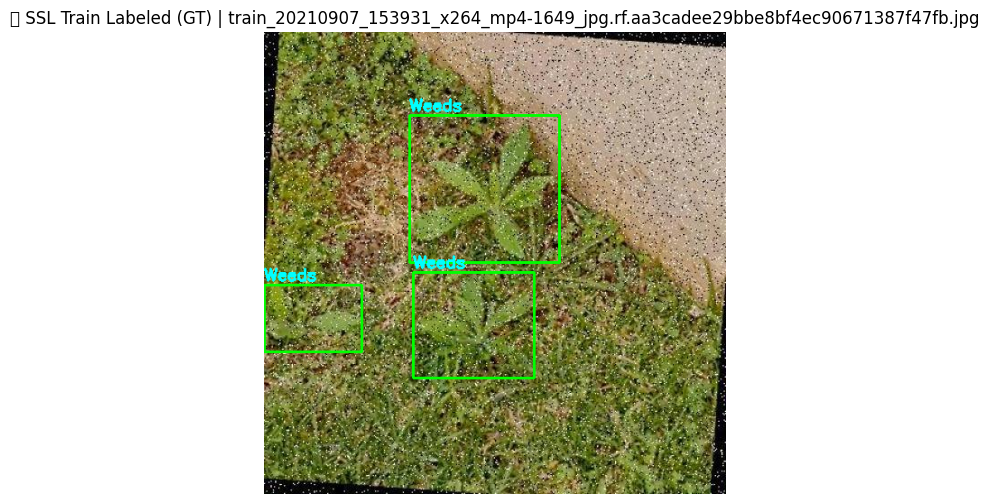

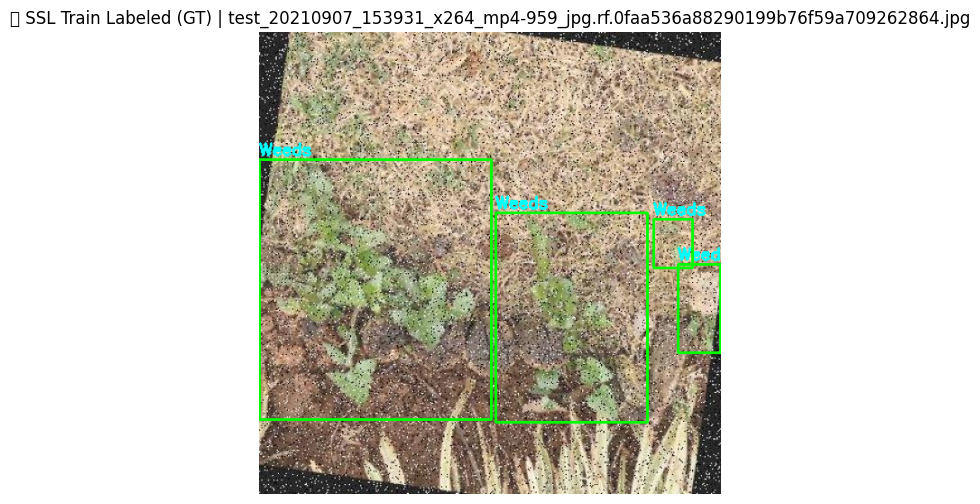

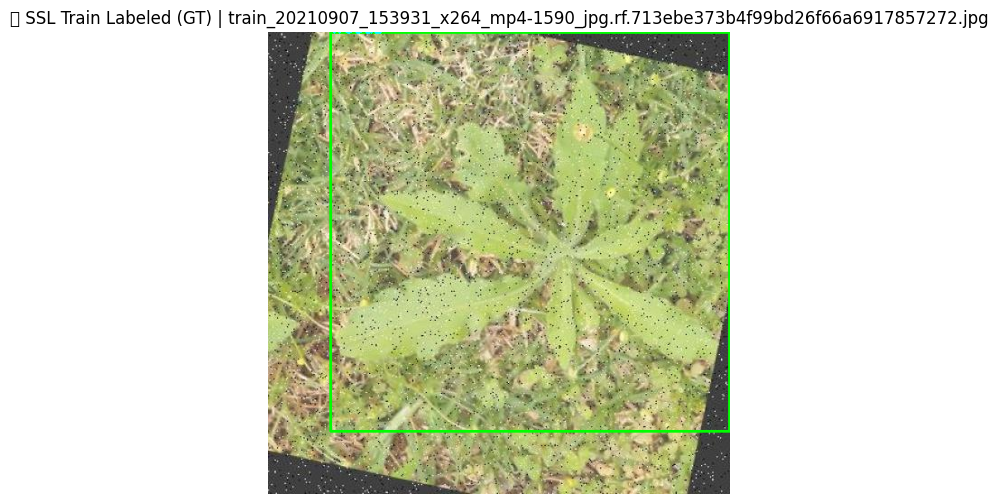

In [7]:
def read_yolo_labels(txt_path: Path):
    rows = []
    if not txt_path.exists():
        return rows
    for line in txt_path.read_text().strip().splitlines():
        parts = line.strip().split()
        if len(parts) < 5:
            continue
        cls, x, y, w, h = parts[:5]
        rows.append((int(float(cls)), float(x), float(y), float(w), float(h)))
    return rows

def visualize_yolo_folder(image_dir: Path, label_dir: Path, title="SSL Labeled", num_images=3):
    img_files = []
    for ext in IMG_EXTS:
        img_files.extend(list(image_dir.glob(f"*{ext}")))
    if not img_files:
        print("No images found:", image_dir)
        return

    random.Random(SEED).shuffle(img_files)
    img_files = img_files[:num_images]

    for img_path in img_files:
        lbl_path = label_dir / f"{img_path.stem}.txt"
        bgr = cv2.imread(str(img_path))
        if bgr is None:
            continue
        h, w = bgr.shape[:2]

        if lbl_path.exists():
            for cls, x, y, bw, bh in read_yolo_labels(lbl_path):
                x1 = int((x - bw/2) * w); y1 = int((y - bh/2) * h)
                x2 = int((x + bw/2) * w); y2 = int((y + bh/2) * h)
                cv2.rectangle(bgr, (x1,y1), (x2,y2), (0,255,0), 2)
                name = CLASS_NAMES[cls] if cls < len(CLASS_NAMES) else str(cls)
                cv2.putText(bgr, name, (x1, max(0,y1-5)),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,0), 2)

        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
        plt.figure()
        plt.imshow(rgb); plt.axis("off")
        plt.title(f"{title} | {img_path.name}")
        plt.show()

visualize_yolo_folder(
    SSL_ROOT / "train_labeled" / "images",
    SSL_ROOT / "train_labeled" / "labels",
    title="✅ SSL Train Labeled (GT)",
    num_images=3
)

# 3) DINOv3 Pretext (Self‑Supervised Distillation) 🧠🌱

We run **LightlyTrain distillation**:
- **Teacher:** `dinov3/vitb16`
- **Student:** `ultralytics/yolo12n.pt`
- **Data:** **ONLY** `train_unlabeled/images`

✅ Output checkpoint (exported by LightlyTrain):
- `out/exported_models/exported_last.pt`

We copy that to:
- `/kaggle/working/dino_pretext_yolov12.pt`

In [8]:
# ============================================================
# Pretext config
# ============================================================
UNLABELED_DIR = SSL_ROOT / "train_unlabeled" / "images"
PRETRAIN_OUT = WORK_DIR / "ssl_pretrain_dinov3_merged"
PRETRAIN_OUT.mkdir(parents=True, exist_ok=True)

# IMPORTANT: attach your DINOv3 weights as a Kaggle input dataset
DINOV3_WEIGHTS_PATH = Path(
    "/kaggle/input/dinov3/dinov3_vitb16_lvd1689m.pth"
)

# Final merged artifact
DINO_PRETEXT_EXPORT = WORK_DIR / "dino_pretext_yolov12.pt"

# Pretext training hyperparams
PRETEXT_EPOCHS = 100
PRETEXT_BATCH = 32

print("UNLABELED_DIR:", UNLABELED_DIR, "| exists:", UNLABELED_DIR.exists())
print("PRETRAIN_OUT:", PRETRAIN_OUT)
print("DINOV3_WEIGHTS_PATH:", DINOV3_WEIGHTS_PATH, "| exists:", DINOV3_WEIGHTS_PATH.exists())
print("DINO_PRETEXT_EXPORT:", DINO_PRETEXT_EXPORT)

UNLABELED_DIR: /kaggle/working/weeds_ssl_merged/train_unlabeled/images | exists: True
PRETRAIN_OUT: /kaggle/working/ssl_pretrain_dinov3_merged
DINOV3_WEIGHTS_PATH: /kaggle/input/dinov3/dinov3_vitb16_lvd1689m.pth | exists: True
DINO_PRETEXT_EXPORT: /kaggle/working/dino_pretext_yolov12.pt


In [9]:
# ============================================================
# Run LightlyTrain distillation (skip if already exported)
# ============================================================
import lightly_train

if DINO_PRETEXT_EXPORT.exists():
    print("[SKIP] Found existing pretext export:", DINO_PRETEXT_EXPORT)
else:
    if not DINOV3_WEIGHTS_PATH.exists():
        raise FileNotFoundError(
            f"DINOv3 teacher weights not found at: {DINOV3_WEIGHTS_PATH}\n"
            "Attach the weights as a Kaggle input dataset and update DINOV3_WEIGHTS_PATH."
        )

    print("🚀 Starting DINOv3 → YOLOv12n distillation (pretext)")
    lightly_train.train(
        out=str(PRETRAIN_OUT),
        data=str(UNLABELED_DIR),
        model="ultralytics/yolo12n.pt",
        method="distillation",
        method_args={
            "teacher": "dinov3/vitb16",  # 👈 no teacher_weights
        },
        epochs=PRETEXT_EPOCHS,
        batch_size=PRETEXT_BATCH,
        precision="16-mixed",
        overwrite=True,
        num_workers=0,
        devices=1,
    )


    print("✅ Pretext training done.")

/usr/local/lib/python3.11/dist-packages/lightly_train/_commands/train.py:276: FutureWarning: `lightly_train.train` is deprecated and will be removed in a future release. Please use `lightly_train.pretrain` instead.
  train_from_config(config=config, called_via_train=True)

Args: {
    "accelerator": "auto",
    "batch_size": 32,
    "callbacks": null,
    "checkpoint": null,
    "data": "/kaggle/working/weeds_ssl_merged/train_unlabeled/images",
    "devices": 1,
    "embed_dim": null,
    "epochs": 100,
    "float32_matmul_precision": "auto",
    "loader_args": null,
    "loggers": null,
    "method": "distillation",
    "method_args": {
        "teacher": "dinov3/vitb16"
    },
    "model": "ultralytics/yolo12n.pt",
    "model_args": null,
    "num_nodes": 1,
    "num_workers": 0,
    "optim": "auto",
    "optim_args": null,
    "out": "/kaggle/working/ssl_pretrain_dinov3_merged",
    "overwrite": true,
    "precision": "16-mixed",
    "resume": null,
    "resume_interrupted": false,


🚀 Starting DINOv3 → YOLOv12n distillation (pretext)


Enabling gradients for parameter 'model.model.0.conv.weight'
Enabling gradients for parameter 'model.model.0.bn.weight'
Enabling gradients for parameter 'model.model.0.bn.bias'
Enabling gradients for parameter 'model.model.1.conv.weight'
Enabling gradients for parameter 'model.model.1.bn.weight'
Enabling gradients for parameter 'model.model.1.bn.bias'
Enabling gradients for parameter 'model.model.2.cv1.conv.weight'
Enabling gradients for parameter 'model.model.2.cv1.bn.weight'
Enabling gradients for parameter 'model.model.2.cv1.bn.bias'
Enabling gradients for parameter 'model.model.2.cv2.conv.weight'
Enabling gradients for parameter 'model.model.2.cv2.bn.weight'
Enabling gradients for parameter 'model.model.2.cv2.bn.bias'
Enabling gradients for parameter 'model.model.2.m.0.cv1.conv.weight'
Enabling gradients for parameter 'model.model.2.m.0.cv1.bn.weight'
Enabling gradients for parameter 'model.model.2.m.0.cv1.bn.bias'
Enabling gradients for parameter 'model.model.2.m.0.cv2.conv.weight

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.
Training completed.
Example: How to use the exported model
----------------------------------------------------------------------------------------
from ultralytics import YOLO

# Load the pretrained model
model = YOLO('/kaggle/working/ssl_pretrain_dinov3_merged/exported_models/exported_last.pt')

# Finetune or evaluate the model
...
----------------------------------------------------------------------------------------

Model exported.


✅ Pretext training done.


In [10]:
# ============================================================
# Copy exported checkpoint to /kaggle/working/dino_pretext_yolov12.pt
# LightlyTrain default export path: out/exported_models/exported_last.pt
# ============================================================
EXPORT_SRC = PRETRAIN_OUT / "exported_models" / "exported_last.pt"
EXPORT_DST = DINO_PRETEXT_EXPORT

if EXPORT_DST.exists():
    print("✅ Pretext export already present:", EXPORT_DST)
else:
    if EXPORT_SRC.exists():
        shutil.copy2(EXPORT_SRC, EXPORT_DST)
        print("✅ Copied exported model to:", EXPORT_DST)
    else:
        print("⚠️ exported_last.pt not found at:", EXPORT_SRC)
        print("Scanning PRETRAIN_OUT for candidate checkpoints/models...")
        candidates = list(PRETRAIN_OUT.rglob("*.pt")) + list(PRETRAIN_OUT.rglob("*.ckpt"))
        for c in candidates[:50]:
            print(" -", c)
        raise FileNotFoundError("Could not locate exported_last.pt. Check PRETRAIN_OUT contents.")

✅ Copied exported model to: /kaggle/working/dino_pretext_yolov12.pt


# 4) Downstream Fine‑Tuning 🎯 (YOLOv12n + DINOv3 Pretraining)

Now we load:
- `/kaggle/working/dino_pretext_yolov12.pt`

And fine‑tune on weeds detection using the **supervised baseline YAML** (Assignment 1 splits).

✅ Output:
- Fine‑tuned weights: `.../weights/best.pt`

In [11]:
# ============================================================
# Downstream training config
# ============================================================
DINO_FINETUNE_EPOCHS = 200
FINETUNE_BATCH = 16
FINETUNE_IMGSZ = 896
FINETUNE_PATIENCE = 30

dino_project = WORK_DIR / "weeds_yolov12_dinov3_pretrained_merged"
dino_name = "yolov12_weeds_dinov3"

print("Project:", dino_project)
print("Run name:", dino_name)

Project: /kaggle/working/weeds_yolov12_dinov3_pretrained_merged
Run name: yolov12_weeds_dinov3


In [12]:
# ============================================================
# Train (skip if best weights already exist)
# ============================================================
DINO_DET_WEIGHTS = dino_project / dino_name / "weights" / "best.pt"

if DINO_DET_WEIGHTS.exists():
    print("[SKIP] Found existing fine-tuned weights:", DINO_DET_WEIGHTS)
else:
    if not DINO_PRETEXT_EXPORT.exists():
        raise FileNotFoundError("Missing pretext export. Run Section 3 first.")

    yolo_dinov3 = YOLO(str(DINO_PRETEXT_EXPORT))

    results_dino = yolo_dinov3.train(
        data=str(BASELINE_YAML),
        epochs=DINO_FINETUNE_EPOCHS,
        imgsz=FINETUNE_IMGSZ,
        batch=FINETUNE_BATCH,
        project=str(dino_project),
        name=dino_name,
        device=0,
        patience=FINETUNE_PATIENCE,
        workers=2,
        exist_ok=True,

        # Augs (keep your previous recipe)
        mosaic=0.5,
        close_mosaic=20,
        mixup=0.10,
        copy_paste=0.0,
        cos_lr=True
    )

    print("✅ Fine-tuned weights:", DINO_DET_WEIGHTS)

Ultralytics 8.3.240 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=20, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/weeds_baseline.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=896, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=/kaggle/working/dino_pretext_yolov12.pt, momentum=0.937, mosaic=0.5, multi_scale=False, name=yolov12_weeds_dinov3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_m

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1



                   all        630       1694       0.95      0.959      0.981      0.802
Speed: 0.3ms preprocess, 6.2ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to /kaggle/working/weeds_yolov12_dinov3_pretrained_merged/yolov12_weeds_dinov3
✅ Fine-tuned weights: /kaggle/working/weeds_yolov12_dinov3_pretrained_merged/yolov12_weeds_dinov3/weights/best.pt


## 📉 Training Curves (DINOv3‑Initialized YOLOv12n)
We plot:
- Train vs Val loss
- mAP curves

/tmp/ipykernel_21/1199957009.py:51: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from current font.
  plt.tight_layout()

/tmp/ipykernel_21/1199957009.py:51: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.
  plt.tight_layout()



Looking for: /kaggle/working/weeds_yolov12_dinov3_pretrained_merged/yolov12_weeds_dinov3/results.csv


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)



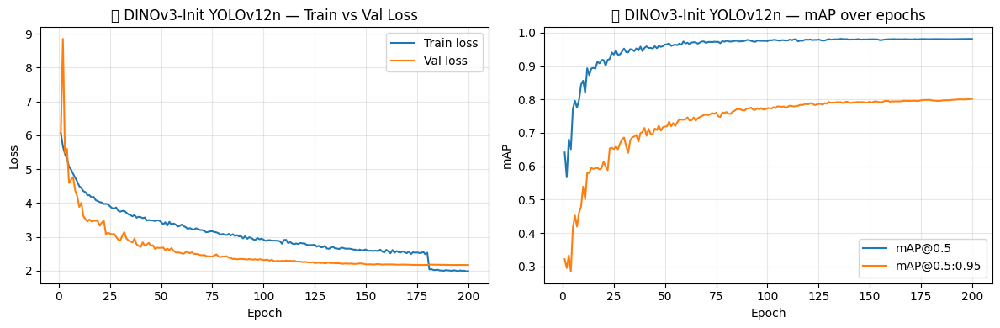

In [13]:
run_dir = dino_project / dino_name
csv_path = run_dir / "results.csv"
print("Looking for:", csv_path)

if not csv_path.exists():
    print("⚠️ results.csv not found. Train first or confirm run directory.")
else:
    df_dino = pd.read_csv(csv_path)
    df_dino.columns = df_dino.columns.str.strip()

    epochs = df_dino["epoch"]

    # train loss (sum of main components)
    train_loss = df_dino.get("train/box_loss", 0) + df_dino.get("train/cls_loss", 0)
    if "train/dfl_loss" in df_dino.columns:
        train_loss = train_loss + df_dino["train/dfl_loss"]

    # val loss
    val_loss = None
    if {"val/box_loss", "val/cls_loss"}.issubset(df_dino.columns):
        val_loss = df_dino["val/box_loss"] + df_dino["val/cls_loss"]
        if "val/dfl_loss" in df_dino.columns:
            val_loss = val_loss + df_dino["val/dfl_loss"]

    map50 = df_dino.get("metrics/mAP50(B)", None)
    map5095 = df_dino.get("metrics/mAP50-95(B)", None)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss, label="Train loss")
    if val_loss is not None:
        plt.plot(epochs, val_loss, label="Val loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("📉 DINOv3‑Init YOLOv12n — Train vs Val Loss")
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(1, 2, 2)
    if map50 is not None:
        plt.plot(epochs, map50, label="mAP@0.5")
    if map5095 is not None:
        plt.plot(epochs, map5095, label="mAP@0.5:0.95")
    plt.xlabel("Epoch")
    plt.ylabel("mAP")
    plt.title("📈 DINOv3‑Init YOLOv12n — mAP over epochs")
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

# 5) Evaluation on Test Split 🧪✅
We report:
- mAP@0.5
- mAP@0.5:0.95
- Precision / Recall
- F1 Score

In [14]:
if not DINO_DET_WEIGHTS.exists():
    raise FileNotFoundError("Fine-tuned weights not found. Run Section 4 first.")

dino_det = YOLO(str(DINO_DET_WEIGHTS))

dino_eval = dino_det.val(
    data=str(BASELINE_YAML),
    split="test",
)

box = dino_eval.box
dino_map50 = float(box.map50)
dino_map5095 = float(box.map)
dino_precision = float(box.p.mean()) if hasattr(box.p, "mean") else float(box.p)
dino_recall = float(box.r.mean()) if hasattr(box.r, "mean") else float(box.r)
dino_f1 = (2 * dino_precision * dino_recall / (dino_precision + dino_recall)) if (dino_precision + dino_recall) > 0 else 0.0

print("✅ DINOv3‑pretrained YOLOv12n — Test metrics")
print("mAP@0.5:", dino_map50)
print("mAP@0.5:0.95:", dino_map5095)
print("Precision:", dino_precision)
print("Recall:", dino_recall)
print("F1 Score:", dino_f1)

Ultralytics 8.3.240 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv12n summary (fused): 159 layers, 2,556,923 parameters, 0 gradients
val: Fast image access ✅ (ping: 2.1±2.8 ms, read: 179.2±55.2 MB/s, size: 82.8 KB)
val: Scanning /kaggle/input/weeds-dataset/test/labels... 631 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 631/631 232.8it/s 2.7s
WARNING ⚠️ val: Cache directory /kaggle/input/weeds-dataset/test is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 40/40 4.2it/s 9.5s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1



                   all        631       1654      0.966      0.952      0.984      0.809
Speed: 2.3ms preprocess, 7.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /kaggle/working/runs/detect/val
✅ DINOv3‑pretrained YOLOv12n — Test metrics
mAP@0.5: 0.9838436486655165
mAP@0.5:0.95: 0.8092944378122642
Precision: 0.9656553137003474
Recall: 0.9519522060349868
F1 Score: 0.9587547990772666


In [15]:
df_results_dino = pd.DataFrame(
    [
        {
            "Model": f"YOLOv12n + DINOv3(pretext epochs={PRETEXT_EPOCHS}, batch={PRETEXT_BATCH})",
            "Type": "Self-Supervised (DINOv3 distillation) + Supervised fine-tune",
            "mAP@0.5": dino_map50,
            "mAP@0.5:0.95": dino_map5095,
            "Precision": dino_precision,
            "Recall": dino_recall,
            "F1 Score": dino_f1,
        }
    ]
)
display(df_results_dino)

out_table = WORK_DIR / "dinov3_merged_results.csv"
df_results_dino.to_csv(out_table, index=False)
print("Saved:", out_table)

,Model,Type,mAP@0.5,mAP@0.5:0.95,Precision,Recall,F1 Score
0,"YOLOv12n + DINOv3(pretext epochs=100, batch=32)",Self-Supervised (DINOv3 distillation) + Superv...,0.983844,0.809294,0.965655,0.951952,0.958755


Saved: /kaggle/working/dinov3_merged_results.csv


# 6) Qualitative Predictions 🖼️ (Ground Truth vs Prediction)
Quick visual sanity check on test images.

/tmp/ipykernel_21/515990751.py:57: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  plt.tight_layout()

/tmp/ipykernel_21/515990751.py:57: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from current font.
  plt.tight_layout()

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)



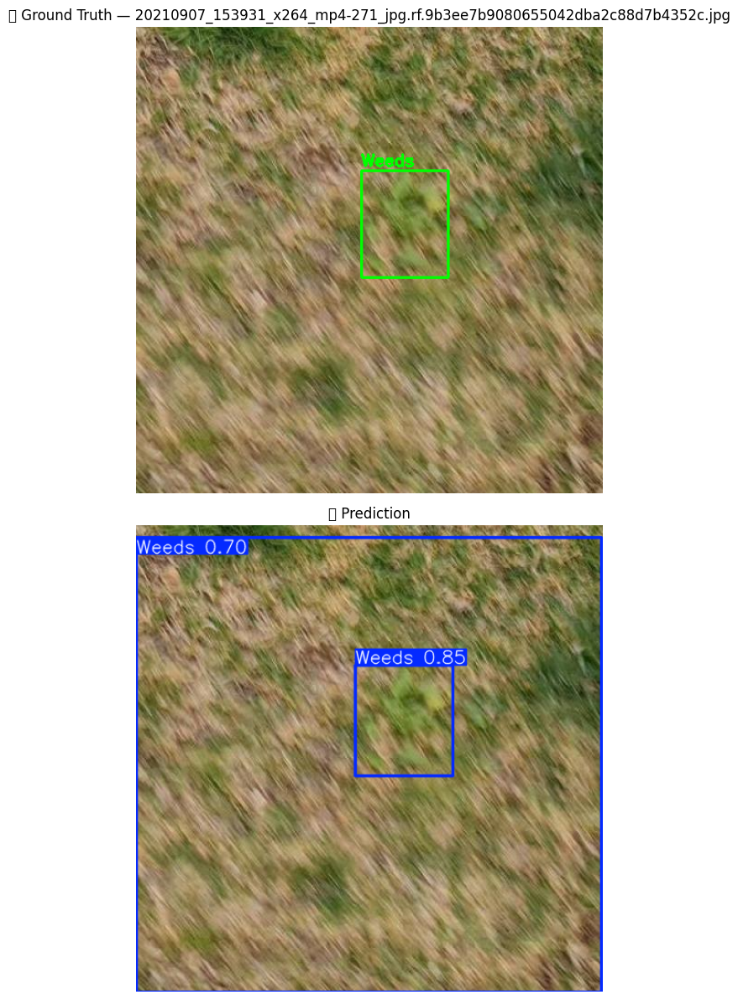

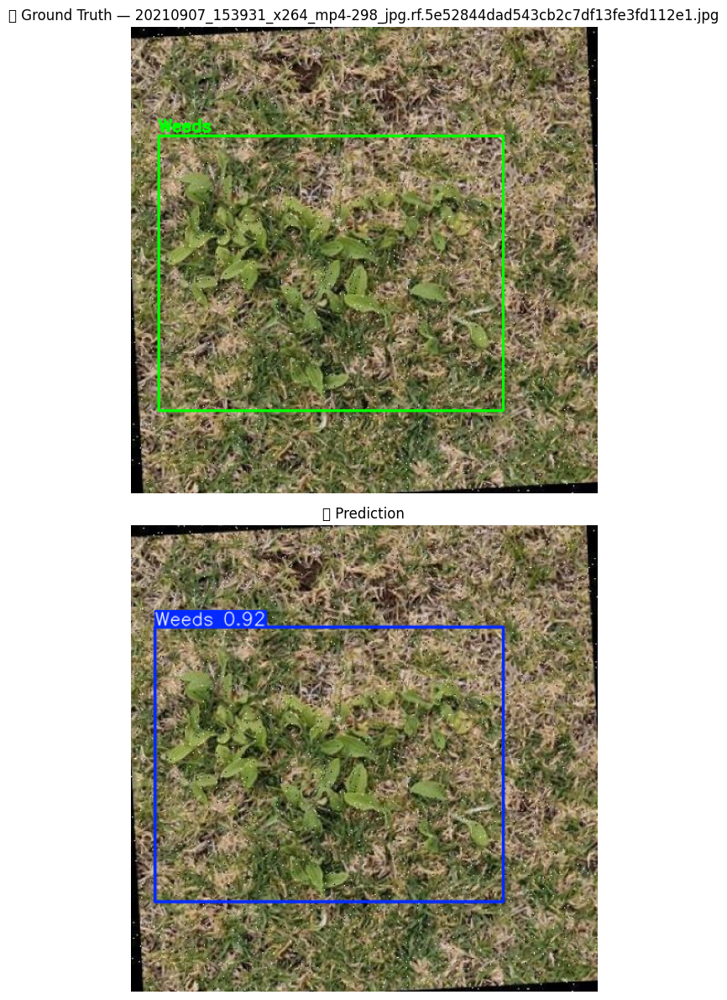

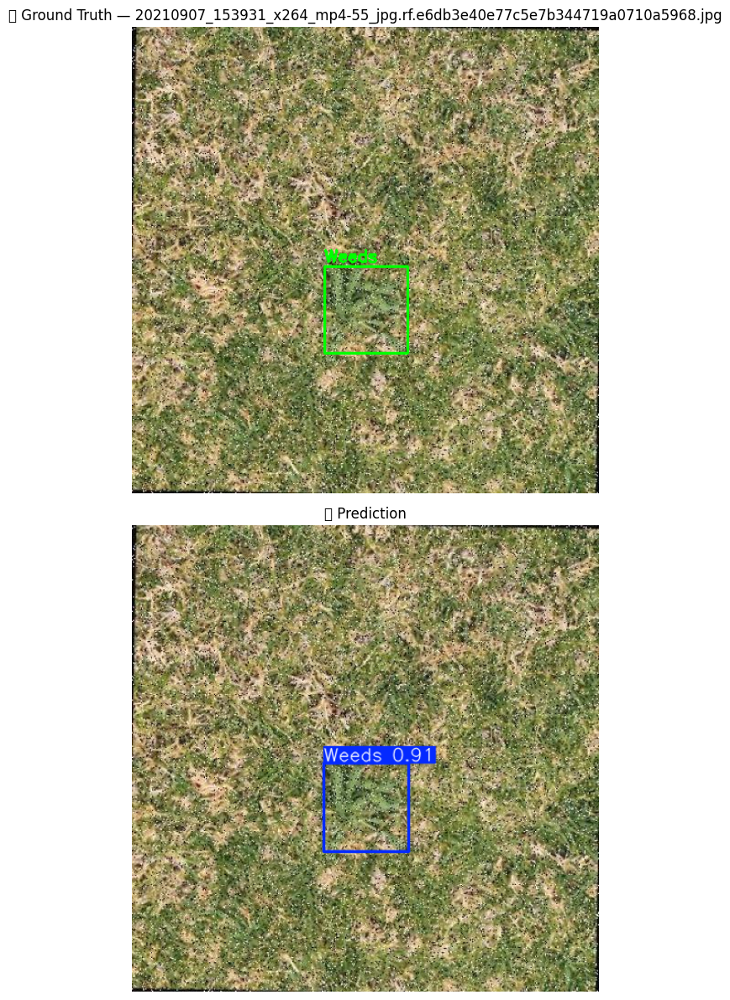

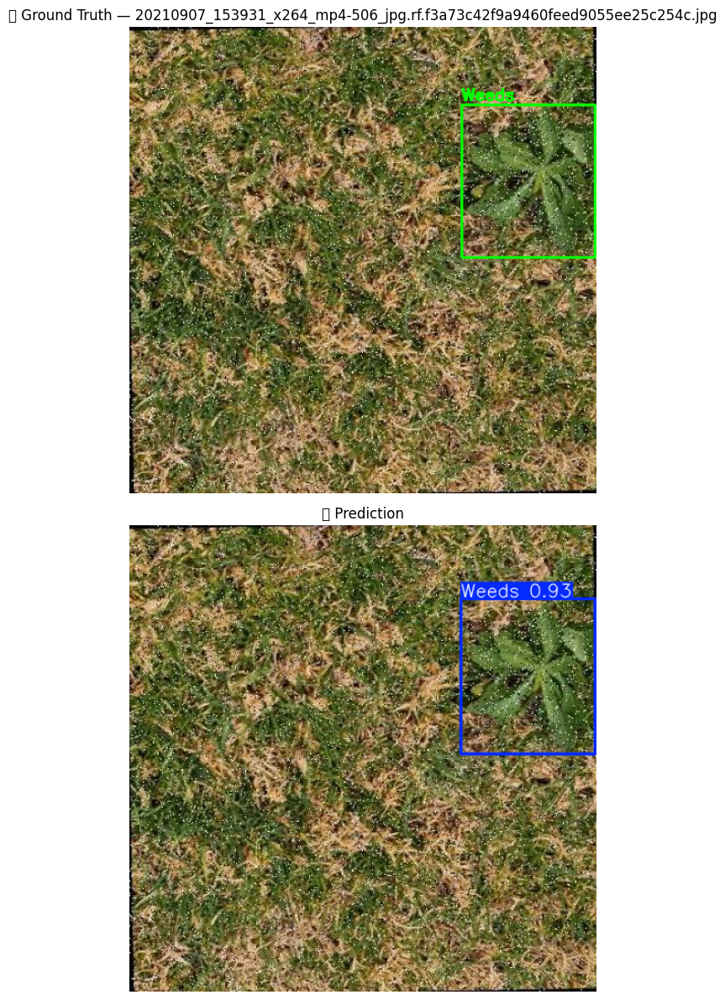

In [16]:
def draw_yolo_labels_on_rgb(img_path: Path, label_path: Path, class_names):
    img_bgr = cv2.imread(str(img_path))
    if img_bgr is None:
        return None
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    if label_path.exists():
        for line in label_path.read_text().strip().splitlines():
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            cls, x, y, bw, bh = map(float, parts[:5])
            cls = int(cls)
            x1 = int((x - bw/2) * w); y1 = int((y - bh/2) * h)
            x2 = int((x + bw/2) * w); y2 = int((y + bh/2) * h)

            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            name = class_names[cls] if cls < len(class_names) else str(cls)
            cv2.putText(img, name, (x1, max(0, y1-5)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)
    return img

def show_gt_vs_pred(model: YOLO, image_dir: Path, label_dir: Path, n_images=4, conf=0.25):
    img_paths = []
    for ext in IMG_EXTS:
        img_paths.extend(list(image_dir.glob(f"*{ext}")))
    if not img_paths:
        print("No images in:", image_dir)
        return

    random.Random(SEED).shuffle(img_paths)
    img_paths = img_paths[:n_images]

    for img_path in img_paths:
        lbl_path = label_dir / (img_path.stem + ".txt")

        # Ground truth
        gt_im = draw_yolo_labels_on_rgb(img_path, lbl_path, CLASS_NAMES)

        # Prediction
        pred = model.predict(str(img_path), conf=conf, verbose=False)[0]
        pred_im = pred.plot()  # BGR by default

        plt.figure(figsize=(7, 12))

        plt.subplot(2, 1, 1)
        plt.imshow(gt_im)
        plt.title(f"✅ Ground Truth — {img_path.name}")
        plt.axis("off")

        plt.subplot(2, 1, 2)
        plt.imshow(cv2.cvtColor(pred_im, cv2.COLOR_BGR2RGB))
        plt.title("🎯 Prediction")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

show_gt_vs_pred(
    dino_det,
    image_dir=DATA_ROOT / "test" / "images",
    label_dir=DATA_ROOT / "test" / "labels",
    n_images=4,
    conf=0.25
)

# 7) Explainability 🧠✨ (ScoreCAM + EigenCAM Grid)

✅ Same plotting rules as your YOLO notebooks:
- **Columns:** Original | ScoreCAM | EigenCAM | Prediction  
- **Rows:** Model names vertically

⚡ Runtime note:
- ScoreCAM is expensive (many forward passes).
- Use `SCORECAM_CHANNELS = 12` on Kaggle for speed (recommended).
- Increase to 24 if you want denser maps.

In [17]:
# ============================================================
# CAM Utilities (ScoreCAM + EigenCAM)
# ============================================================
def find_last_conv_layer(module: nn.Module) -> nn.Module:
    last = None
    for m in module.modules():
        if isinstance(m, nn.Conv2d):
            last = m
    if last is None:
        raise ValueError("No Conv2d layer found.")
    return last

def normalize01(x: np.ndarray, eps: float = 1e-6) -> np.ndarray:
    x = x.astype(np.float32)
    mn, mx = float(np.min(x)), float(np.max(x))
    if (mx - mn) < eps:
        return np.zeros_like(x, dtype=np.float32)
    return (x - mn) / (mx - mn + eps)

def overlay_heatmap(rgb_uint8: np.ndarray, heat01: np.ndarray, alpha: float = 0.45) -> np.ndarray:
    heat_u8 = np.uint8(np.clip(heat01, 0, 1) * 255)
    heat_bgr = cv2.applyColorMap(heat_u8, cv2.COLORMAP_JET)
    heat_rgb = cv2.cvtColor(heat_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    base = rgb_uint8.astype(np.float32) / 255.0
    out = (1 - alpha) * base + alpha * heat_rgb
    return np.clip(out, 0, 1)

def eigencam_from_activations(acts_chw: np.ndarray) -> np.ndarray:
    """
    EigenCAM = first SVD component of activations (C,H,W).
    """
    C, H, W = acts_chw.shape
    A = acts_chw.reshape(C, -1).T  # (H*W, C)
    A = np.nan_to_num(A)

    _, _, Vt = np.linalg.svd(A, full_matrices=False)
    pc = Vt[0]  # (C,)
    cam = (A @ pc).reshape(H, W)
    cam = np.maximum(cam, 0)
    return normalize01(cam)

def detection_score_sum_conf(
    yolo: YOLO,
    img_bgr: np.ndarray,
    class_id: int = 0,
    imgsz: int = 640,
    conf: float = 0.05,
    iou: float = 0.7,
    device=0
) -> float:
    res = yolo.predict(img_bgr, imgsz=imgsz, conf=conf, iou=iou, device=device, verbose=False)[0]
    if res.boxes is None or len(res.boxes) == 0:
        return 0.0
    cls = res.boxes.cls.detach().cpu().numpy().astype(int)
    confs = res.boxes.conf.detach().cpu().numpy().astype(np.float32)
    confs = confs[cls == int(class_id)] if class_id is not None else confs
    return float(np.sum(confs)) if confs.size else 0.0

def scorecam_from_activations(
    yolo: YOLO,
    base_bgr: np.ndarray,
    acts_chw: np.ndarray,
    class_id: int = 0,
    imgsz: int = 640,
    max_channels: int = 12,
    conf_score: float = 0.05,
    iou_score: float = 0.7,
    device=0,
):
    """
    ScoreCAM (gradient-free):
      - channel activation -> upsample mask
      - run detector on masked image -> score
      - weighted sum -> heatmap
    """
    C, H, W = acts_chw.shape
    flat = acts_chw.reshape(C, -1)
    var = flat.var(axis=1)

    k = int(min(max_channels, C))
    top_idx = np.argsort(-var)[:k]

    base_float = base_bgr.astype(np.float32) / 255.0
    heat = np.zeros((imgsz, imgsz), dtype=np.float32)

    for ch in top_idx:
        amap = acts_chw[ch]
        amap01 = normalize01(amap)
        mask = cv2.resize(amap01, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
        mask = np.clip(mask, 0, 1)

        masked = base_float * mask[..., None]
        masked_u8 = np.uint8(np.clip(masked * 255.0, 0, 255))

        s = detection_score_sum_conf(
            yolo=yolo,
            img_bgr=masked_u8,
            class_id=class_id,
            imgsz=imgsz,
            conf=conf_score,
            iou=iou_score,
            device=device
        )
        heat += (s * mask.astype(np.float32))

    return normalize01(np.maximum(heat, 0))

def capture_activations_via_hook(
    yolo: YOLO,
    img_bgr: np.ndarray,
    target_layer: nn.Module,
    imgsz: int = 640,
    conf_pred: float = 0.25,
    iou_pred: float = 0.7,
    device=0,
):
    cache = {"acts": None}

    def _hook(_, __, output):
        t = output[0] if isinstance(output, (tuple, list)) else output
        if torch.is_tensor(t):
            cache["acts"] = t.detach().float().cpu()

    h = target_layer.register_forward_hook(_hook)
    try:
        res = yolo.predict(img_bgr, imgsz=imgsz, conf=conf_pred, iou=iou_pred, device=device, verbose=False)
    finally:
        h.remove()

    if cache["acts"] is None:
        raise RuntimeError("No activations captured. Try a different target layer.")
    acts = cache["acts"]
    if acts.dim() == 3:
        acts = acts.unsqueeze(0)
    return res[0], acts[0].numpy()
def find_cam_layer_by_shape(
    yolo: YOLO,
    img_bgr: np.ndarray,
    imgsz: int = 640,
    device=0,
    min_hw: int = 10,
):
    chosen = {"layer": None}

    hooks = []
    def make_hook(m):
        def _hook(_, __, out):
            t = out[0] if isinstance(out, (tuple, list)) else out
            if torch.is_tensor(t) and t.dim() == 4:
                _, _, h, w = t.shape
                if h >= min_hw and w >= min_hw:
                    chosen["layer"] = m  # keep updating -> ends up "last good" conv
        return _hook

    for m in yolo.model.modules():
        if isinstance(m, nn.Conv2d):
            hooks.append(m.register_forward_hook(make_hook(m)))

    try:
        yolo.predict(img_bgr, imgsz=imgsz, conf=0.25, iou=0.7, device=device, verbose=False)
    finally:
        for h in hooks:
            h.remove()

    if chosen["layer"] is None:
        raise RuntimeError("No suitable conv layer found for CAM.")
    return chosen["layer"]

def plot_xai_grid(
    models: dict,
    img_path: Path,
    class_id: int = 0,
    imgsz: int = 640,
    conf_pred: float = 0.25,
    iou_pred: float = 0.7,
    scorecam_channels: int = 12,
):
    """
    Columns: Original | ScoreCAM | EigenCAM | Prediction
    Rows: model names vertically
    """
    bgr0 = cv2.imread(str(img_path))
    if bgr0 is None:
        raise FileNotFoundError(f"Could not read image: {img_path}")

    base_bgr = cv2.resize(bgr0, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
    base_rgb = cv2.cvtColor(base_bgr, cv2.COLOR_BGR2RGB)

    rows = []
    for row_name, weights in models.items():
        try:
            rows.append((row_name, YOLO(str(weights))))
        except Exception as e:
            print(f"[WARN] Skip {row_name}: {e}")

    if len(rows) == 0:
        raise RuntimeError("No models loaded for grid.")

    n = len(rows)
    fig, axes = plt.subplots(n, 4, figsize=(4 * 4.2, n * 4.2))
    if n == 1:
        axes = axes.reshape(1, 4)

    titles = ["Original", "ScoreCAM", "EigenCAM", "Prediction"]
    for j, t in enumerate(titles):
        axes[0, j].set_title(t, fontsize=13, fontweight="bold")

    for i, (row_name, yolo) in enumerate(rows):
        target_layer = find_cam_layer_by_shape(yolo, base_bgr, imgsz=imgsz, device=0, min_hw=10)

        r, acts_chw = capture_activations_via_hook(
            yolo=yolo,
            img_bgr=base_bgr,
            target_layer=target_layer,
            imgsz=imgsz,
            conf_pred=conf_pred,
            iou_pred=iou_pred,
            device=0,
        )

        # Original
        axes[i, 0].imshow(base_rgb)
        axes[i, 0].axis("off")
        axes[i, 0].set_ylabel(row_name, fontsize=12, fontweight="bold", rotation=90)

        # ScoreCAM
        sc = scorecam_from_activations(
            yolo=yolo,
            base_bgr=base_bgr,
            acts_chw=acts_chw,
            class_id=class_id,
            imgsz=imgsz,
            max_channels=scorecam_channels,
            conf_score=0.05,
            iou_score=iou_pred,
            device=0,
        )
        axes[i, 1].imshow(overlay_heatmap(base_rgb, sc, alpha=0.45))
        axes[i, 1].axis("off")

        # EigenCAM
        ec_small = eigencam_from_activations(acts_chw)
        ec = cv2.resize(ec_small, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
        axes[i, 2].imshow(overlay_heatmap(base_rgb, ec, alpha=0.45))
        axes[i, 2].axis("off")

        # Prediction
        pred_rgb = cv2.cvtColor(r.plot(), cv2.COLOR_BGR2RGB)
        axes[i, 3].imshow(pred_rgb)
        axes[i, 3].axis("off")

    plt.tight_layout()
    plt.show()

Sample image: 20210907_153931_x264_mp4-1310_jpg.rf.fd93d7da7f8ba76155b474b2985a2bf5.jpg


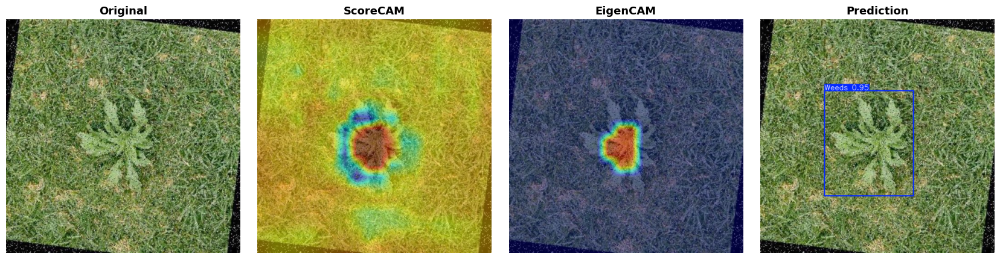

In [18]:
# ============================================================
# Run XAI grid on one test image
# Rows: Baseline YOLOv12n (optional if weights exist) + DINOv3 fine-tuned
# ============================================================
test_dir = DATA_ROOT / "test" / "images"
test_imgs_list = list_images(test_dir)
sample_img = Path(random.choice(test_imgs_list))
print("Sample image:", sample_img.name)

MODEL_ZOO = {}

# Optional: include your supervised baseline weights if available from Assignment 1
BASELINE_BEST = Path("/kaggle/working/weeds_yolov12_train/yolov12_weeds/weights/best.pt")
if BASELINE_BEST.exists():
    MODEL_ZOO["YOLOv12n (Supervised Baseline)"] = str(BASELINE_BEST)

# Always include DINOv3 fine-tuned model
MODEL_ZOO["YOLOv12n + DINOv3 (Fine‑tuned)"] = str(DINO_DET_WEIGHTS)

SCORECAM_CHANNELS = 12  # increase to 24 if you want denser CAM maps (slower)

plot_xai_grid(
    models=MODEL_ZOO,
    img_path=sample_img,
    class_id=0,
    imgsz=640,
    conf_pred=0.25,
    iou_pred=0.7,
    scorecam_channels=SCORECAM_CHANNELS,
)

## 📌 Useful artifacts saved
- Pretext export: `/kaggle/working/dino_pretext_yolov12.pt`  
- Fine‑tuned detector: `.../weeds_yolov12_dinov3_pretrained_merged/yolov12_weeds_dinov3/weights/best.pt`  
- Results table: `/kaggle/working/dinov3_merged_results.csv`